In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

from zipfile import ZipFile
from urllib.request import urlretrieve

from IPython.display import Image
from function import *

%matplotlib inline

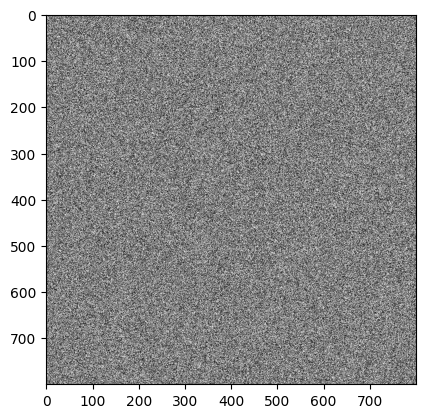

In [2]:
np.random.seed(6)
img = np.random.randint(0,256,(800,800),dtype=np.uint8)
# print(img)

plt.imshow(img,cmap='gray')

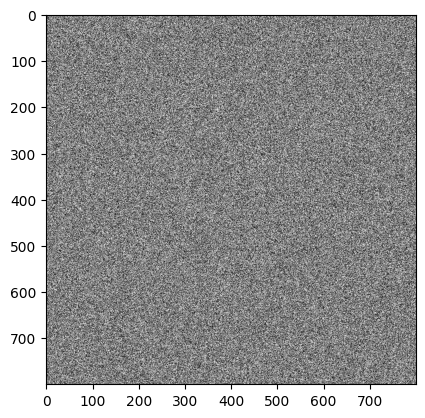

In [3]:
img_invert = 255 - img
plt.imshow(img_invert, cmap='gray')

Text(0.5, 1.0, 'alpha_values 100')

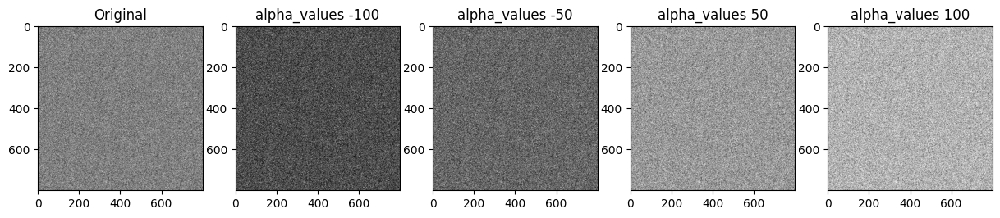

In [4]:

plt.figure(figsize=(15, 10))
plt.subplot(151);plt.imshow(img, cmap="gray");plt.title("Original")
plt.subplot(152);plt.imshow(brightness(img,-100), cmap="gray");plt.title("alpha_values -100")
plt.subplot(153);plt.imshow(brightness(img, -50), cmap="gray");plt.title("alpha_values -50")
plt.subplot(154);plt.imshow(brightness(img,  50), cmap="gray");plt.title("alpha_values 50")
plt.subplot(155);plt.imshow(brightness(img, 100), cmap="gray");plt.title("alpha_values 100")


Text(0.5, 1.0, 'beta_values 1.3')

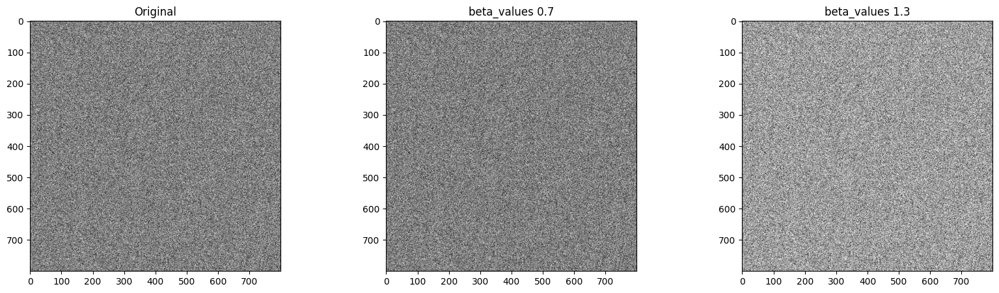

In [5]:
plt.figure(figsize=(20,5))
plt.subplot(131);plt.imshow(img, cmap="gray");plt.title("Original")
plt.subplot(132);plt.imshow(multip_brightness(img,0.7), cmap="gray");plt.title("beta_values 0.7")
plt.subplot(133);plt.imshow(multip_brightness(img,1.3), cmap="gray");plt.title("beta_values 1.3")


Text(0.5, 1.0, 'RGB Channel')

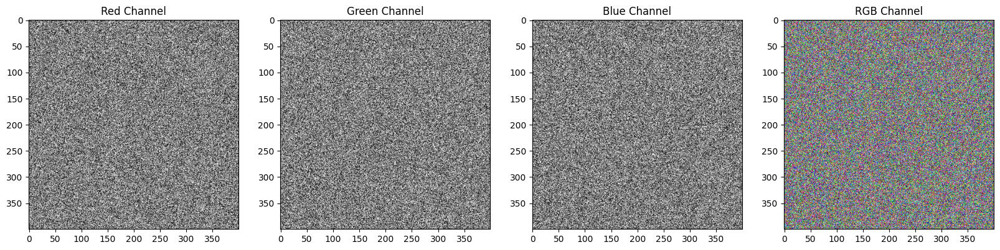

In [6]:
B = img[:400, :400]
G = img[:400, 400:]
R = img[400:, :400]

RGB = cv2.merge((B,G,R))

plt.figure(figsize=[20, 5])
plt.subplot(141);plt.imshow(R, cmap="gray");plt.title("Red Channel")
plt.subplot(142);plt.imshow(G, cmap="gray");plt.title("Green Channel")
plt.subplot(143);plt.imshow(B, cmap="gray");plt.title("Blue Channel")
plt.subplot(144);plt.imshow(RGB[:, :, ::-1]);plt.title("RGB Channel") #chuyen tu BGR sang RGB

Text(0.5, 1.0, 'beta_values 1.3')

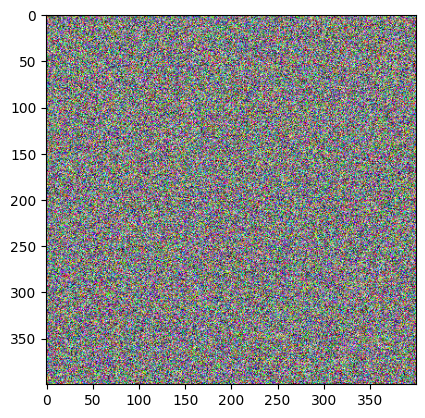

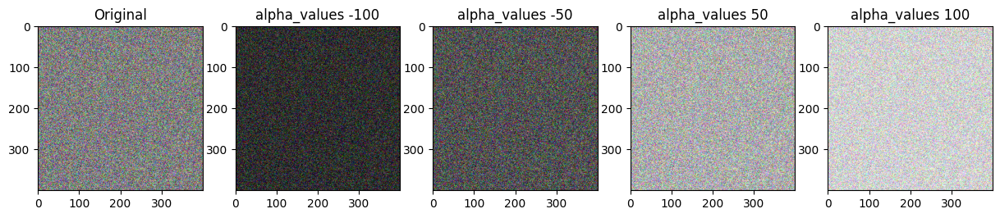

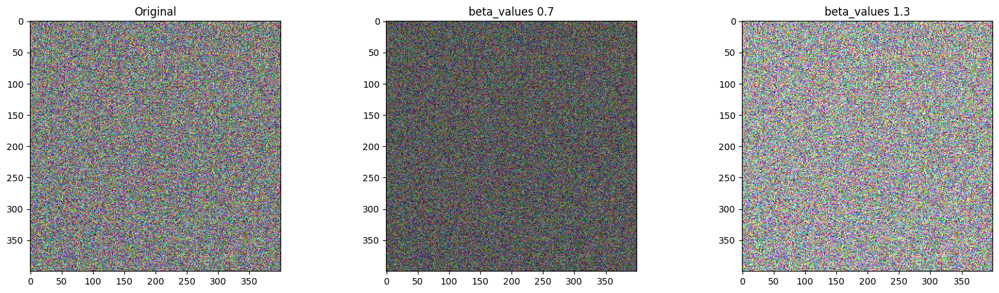

In [7]:
#6.2
plt.imshow(RGB,cmap='gray')

#6.3
plt.figure(figsize=(15, 10))
plt.subplot(151);plt.imshow(RGB, cmap="gray");plt.title("Original")
plt.subplot(152);plt.imshow(brightness(RGB,-100), cmap="gray");plt.title("alpha_values -100")
plt.subplot(153);plt.imshow(brightness(RGB, -50), cmap="gray");plt.title("alpha_values -50")
plt.subplot(154);plt.imshow(brightness(RGB,  50), cmap="gray");plt.title("alpha_values 50")
plt.subplot(155);plt.imshow(brightness(RGB, 100), cmap="gray");plt.title("alpha_values 100")

#6.4
plt.figure(figsize=(20,5))
plt.subplot(131);plt.imshow(RGB, cmap="gray");plt.title("Original")
plt.subplot(132);plt.imshow(multip_brightness(RGB,0.7), cmap="gray");plt.title("beta_values 0.7")
plt.subplot(133);plt.imshow(multip_brightness(RGB,1.3), cmap="gray");plt.title("beta_values 1.3")

Text(0.5, 1.0, 'HSV')

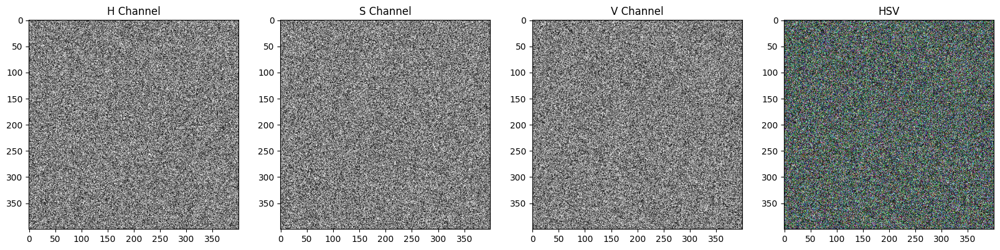

In [8]:
H = img[:400, :400]
S = img[:400, 400:]
V = img[400:, :400]

RGB = cv2.merge((H,S,V))
HSV_img = cv2.cvtColor(RGB,cv2.COLOR_HSV2BGR)

plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(H, cmap="gray");plt.title("H Channel")
plt.subplot(142);plt.imshow(S, cmap="gray");plt.title("S Channel")
plt.subplot(143);plt.imshow(V, cmap="gray");plt.title("V Channel")
plt.subplot(144);plt.imshow(HSV_img);   plt.title("HSV")

TypeError: cannot unpack non-iterable Figure object

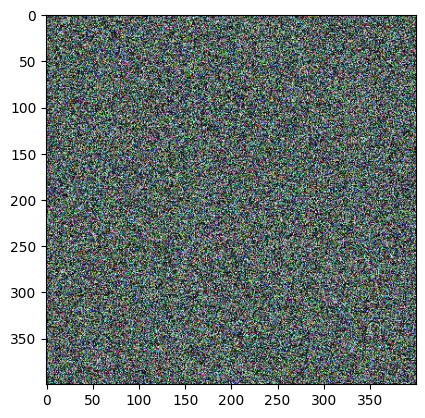

<Figure size 1500x1000 with 0 Axes>

In [ ]:
#8.2
plt.imshow(HSV_img,cmap='gray')

#8.3
plt.figure(figsize=(15, 10))
plt.subplot(151);plt.imshow(HSV_img, cmap="gray");plt.title("Original")
plt.subplot(152);plt.imshow(brightness(HSV_img,-100), cmap="gray");plt.title("alpha_values -100")
plt.subplot(153);plt.imshow(brightness(HSV_img, -50), cmap="gray");plt.title("alpha_values -50")
plt.subplot(154);plt.imshow(brightness(HSV_img,  50), cmap="gray");plt.title("alpha_values 50")
plt.subplot(155);plt.imshow(brightness(HSV_img, 100), cmap="gray");plt.title("alpha_values 100")

#8.4
plt.figure(figsize=(20,5))
plt.subplot(131);plt.imshow(HSV_img, cmap="gray");plt.title("Original")
plt.subplot(132);plt.imshow(multip_brightness(HSV_img,0.7), cmap="gray");plt.title("beta_values 0.7")
plt.subplot(133);plt.imshow(multip_brightness(HSV_img,1.3), cmap="gray");plt.title("beta_values 1.3")

(np.float64(-0.5), np.float64(799.5), np.float64(799.5), np.float64(-0.5))

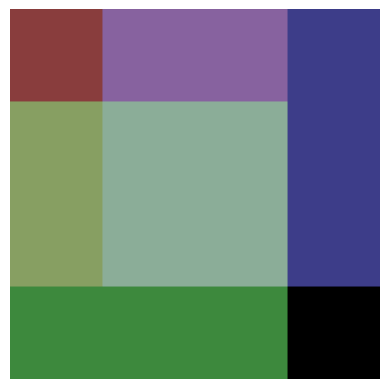

In [12]:
A0 = np.zeros((800, 800, 4), dtype=np.uint8)

P1 = A0[:400, :400]
P2 = A0[:400, 400:]
P3 = A0[400:, :400]

P1 = cv2.resize(P1,(600,600))
P2 = cv2.resize(P2,(600,600))
P3 = cv2.resize(P3,(600,600))

P1 = cv2.cvtColor(P1, cv2.COLOR_RGB2RGBA)
P2 = cv2.cvtColor(P2, cv2.COLOR_RGB2RGBA)
P3 = cv2.cvtColor(P3, cv2.COLOR_RGB2RGBA)
A0 = cv2.cvtColor(A0, cv2.COLOR_RGB2RGBA)

R0 = np.zeros_like(P1, dtype=np.uint8)
B0 = np.zeros_like(P2, dtype=np.uint8)
G0 = np.zeros_like(P3, dtype=np.uint8)

R0[:, :, :] = [255, 0, 0, 100]  # RED , alpha = 100
B0[:, :, :] = [0, 0, 255, 100]  # BLUE , alpha = 100
G0[:, :, :] = [0, 255, 0, 100]  # GREEN , alpha = 100

A0[:, :, 3] = 255


A0[:600, :600] = cv2.addWeighted(R0, 100/255.0, A0[:600, :600], 1 - 100/255.0, 0)
A0[:600, 200:] = cv2.addWeighted(B0, 100/255.0, A0[:600, 200:], 1 - 100/255.0, 0)  
A0[200:, :600] = cv2.addWeighted(G0, 100/255.0, A0[200:, :600], 1 - 100/255.0, 0)

plt.imshow(A0)
plt.axis("off")


In [11]:
A0 = np.zeros((800, 800, 4), dtype=np.uint8)
A0 = cv2.cvtColor(A0, cv2.COLOR_RGB2RGBA)
A0[:, :, 3] = 255


filename = 'video_lab1.mp4'
fps = 25
frame_size = (800, 800) 
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec video
video = cv2.VideoWriter(filename, fourcc, fps, frame_size)

for color_value in range(256):
    R0[:, :, :] = [color_value, 0, 0, 100]  
    B0[:, :, :] = [0, 0, color_value, 100]  
    G0[:, :, :] = [0, color_value, 0, 100]
    video.write(megre_to_frame(R0,G0,B0,A0))

video.release()
